# Inicio

## Enfoque

Este estudio plantea una busqueda iterativa de caracteristicas y entrenamiento del modelo, bajo mi fascinacion de ver un modelo crecer y su paralelismo con las percepcion humana, ver crecer un modelo es como darle progresivamente mas extremidades para percibir el mundo que nos interesa que identifique, por eso se sigue el siguiente flujo de trabajo para esta libreta:

...

- While(caracteristicas)
    - Exploracion de Caracteristica
        - Analisis Aparente
        - Metricas y Separacion simple
        - Modelo entrenado con la caracteristica
    - Entrenamiento de modelo global <- Este es el que crece
- Seleccion de caracteristicas
- Reduccion del modelo y entrenamiento final

## Librerias

In [5]:
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
import seaborn as sns
from skimage.feature import graycomatrix, graycoprops
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

plt.rcParams['figure.figsize'] = (12, 6)

# Definición de rutas y parámetros globales
BASE_DIR = 'data'
CLASSES = ['fire', 'smoke','neutral']
IMGIZE = (256, 256)

## Cargar imagenes

In [7]:
dataset = {cls: [] for cls in CLASSES}
image_paths = {cls: [] for cls in CLASSES}

def load_images_from_folder(folder_path, label):
    loaded_images = []
    extension = '*.jpg'
    files = []
    
    files.extend(glob.glob(os.path.join(folder_path, extension)))
        
    files.sort()
    
    for file_path in files:

        img = cv2.imread(file_path)
        if img is not None:
            
            img = cv2.resize(img, IMGIZE)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            loaded_images.append(img)
            image_paths[label].append(file_path)
            
    return loaded_images

# Ejecución de la carga
for cls in CLASSES:
    path = os.path.join(BASE_DIR, cls)
    if os.path.exists(path):
        dataset[cls] = load_images_from_folder(path, cls)
    else:
        print(f"Error: La ruta {path} no existe.")

# Verificación de totales
print("-" * 30)
for cls in CLASSES:
    print(f"Total imágenes en memoria [{cls}]: {len(dataset[cls])}")

------------------------------
Total imágenes en memoria [fire]: 28
Total imágenes en memoria [smoke]: 29
Total imágenes en memoria [neutral]: 28


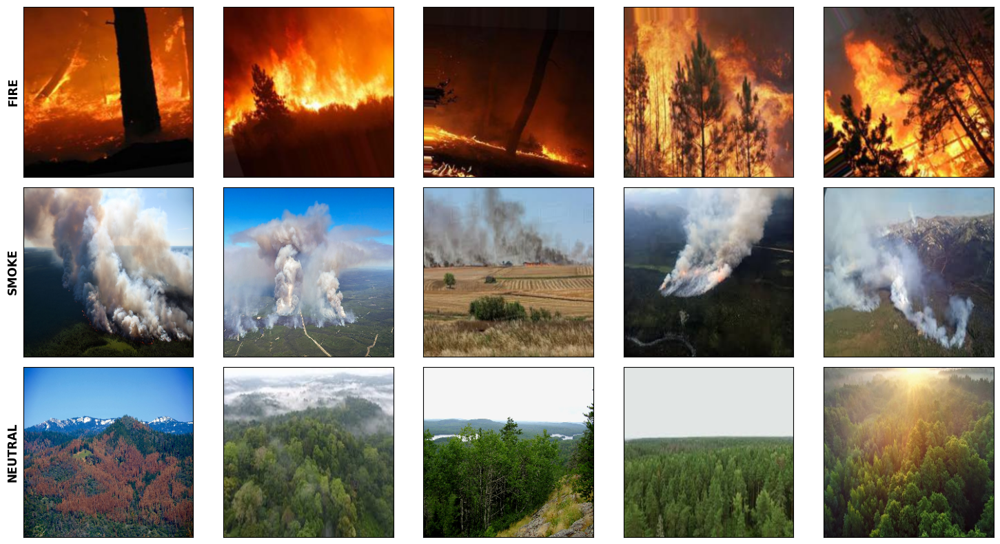

In [8]:
def plotamples(data_dict, namples=5):
    fig, axes = plt.subplots(len(CLASSES), namples, figsize=(15, 8))
    
    for i, cls in enumerate(CLASSES):
        images = data_dict[cls]

        if len(images) >= namples:
            samples = images[:namples]
        else:
            samples = images
            
        for j, img in enumerate(samples):
            ax = axes[i, j]
            ax.imshow(img)
            if j == 0:
                ax.set_ylabel(cls.upper(), fontsize=12, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
            
    plt.tight_layout()
    plt.show()

plotamples(dataset, 5)

# Exploracion de Caracteristicas

## HSV

Hipotesis:

Se eligió el espacio de color HSV para el análisis de características debido a su capacidad para separar la información del color de la luz. Esto muy importante en entornos forestales donde las sombras y la luz solar varían. HSV permite definir umbrales precisos para aislar la alta saturación y el brillo puntual del fuego, diferenciándolos eficazmente de la baja saturación del humo.

Como feature busca hacer la primera separacion entre el cluster de humo/fuego contra un bosque normal y tranquilo que podria tener hojas rojas por el tipo de arbol o iluminacion calida como la de un atardecer

In [12]:
def mostrar_canales(dataset, indice_muestra=0):
   
    """
    Técnica: Descomposición de Canales HSV vs Luminancia
    Objetivo: Visualizar dónde se separa mejor el fuego del humo.
    """
    
    plt.figure(figsize=(20, 10))
    plt.suptitle(f"Exploración 1: Descomposición Espectral (Muestra #{indice_muestra})", fontsize=16, y=1.02)
    
    rows = len(CLASSES)
    cols = 4 # Original, Gris, Saturación, Valor (Brillo)
    
    for i, cls in enumerate(CLASSES):
        if len(dataset[cls]) > indice_muestra:
            img_rgb = dataset[cls][indice_muestra]
        else:
            continue
            
        # 1. Original
        plt.subplot(rows, cols, i*cols + 1)
        plt.imshow(img_rgb)
        plt.title(f"{cls.upper()} - Original")
        plt.axis('off')
        
        # 2. Escala de Grises (Luminancia pura)
        gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        plt.subplot(rows, cols, i*cols + 2)
        plt.imshow(gray, cmap='gray')
        plt.title("Gris (Luminancia)")
        plt.axis('off')
        
        hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)
        
        # 3. Canal de Saturación (S)
        plt.subplot(rows, cols, i*cols + 3)
        plt.imshow(s, cmap='inferno')
        plt.title("Canal S (Saturación)")
        plt.axis('off')
        
        # 4. Canal de Valor (V = Brillo)
        plt.subplot(rows, cols, i*cols + 4)
        plt.imshow(v, cmap='gray')
        plt.title("Canal V (Brillo)")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

#### Muestreo y Analisis Aparente

##### Muestra 19:

Si solo vieramos el canal S veriamos la imagen neutral igual o aun mas on fire (literalmente xd) que la del fuego real, afortunadamente aqui luminancia y brillo hacen la diferencia mandando a full blanco las llamas, en la muestra

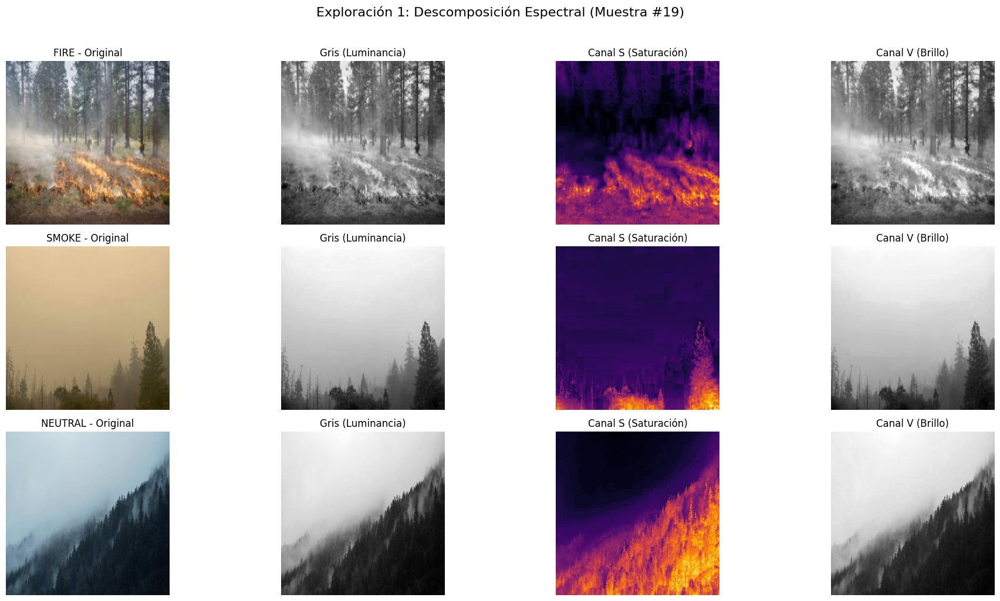

In [15]:
mostrar_canales(dataset, 19)

##### Muestra 15:

Podemos ver como la saturacion es un muy buen marcador de que algo esta en llamas

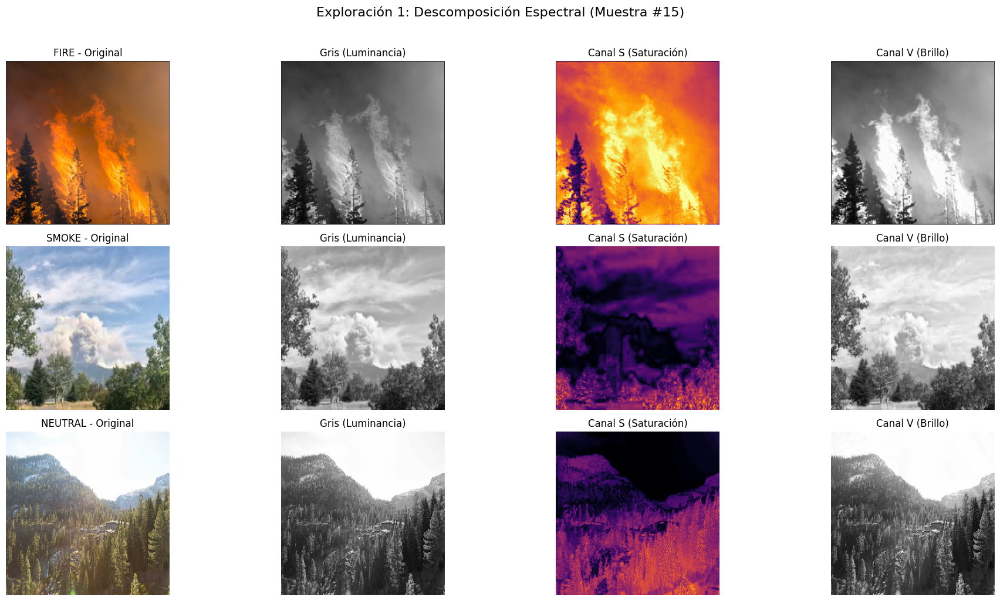

In [17]:
mostrar_canales(dataset, 15)

##### Muestra 12

Nos vuelve a confirmar que la saturacion sola no sera un buen indicador, sin embargo creo que podemos añadir aqui que un bosque en llamas hasta el momento ha sido una combinacion de saturacion baja y alta por el humo en contraste con un bosque claro, que no tiene manchas de luminosidad muy marcadas como las imagenes donde se ve fuego

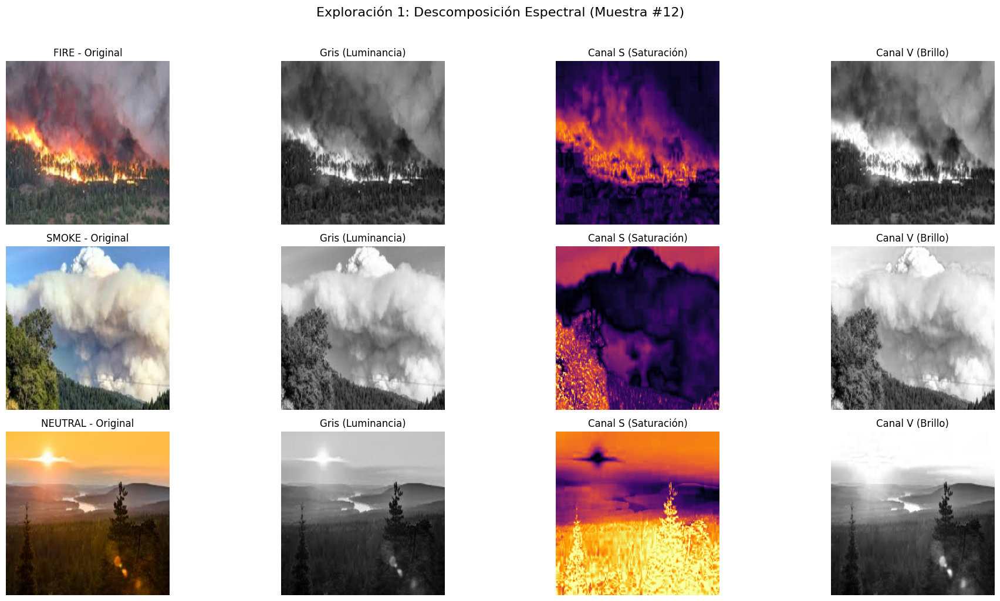

In [19]:
mostrar_canales(dataset, 12)

##### Muestra 9: 

Es prometedora para la combinacion de Saturacion + Brillo ya que deja al descubierto que por mucha separacion que otorgue la saturacion si el brillo de esas zonas es bajo no estamos hablando de fuego, note como las 2 imagenes son casi identicas en saturación, pero en brillo son completamente distintas

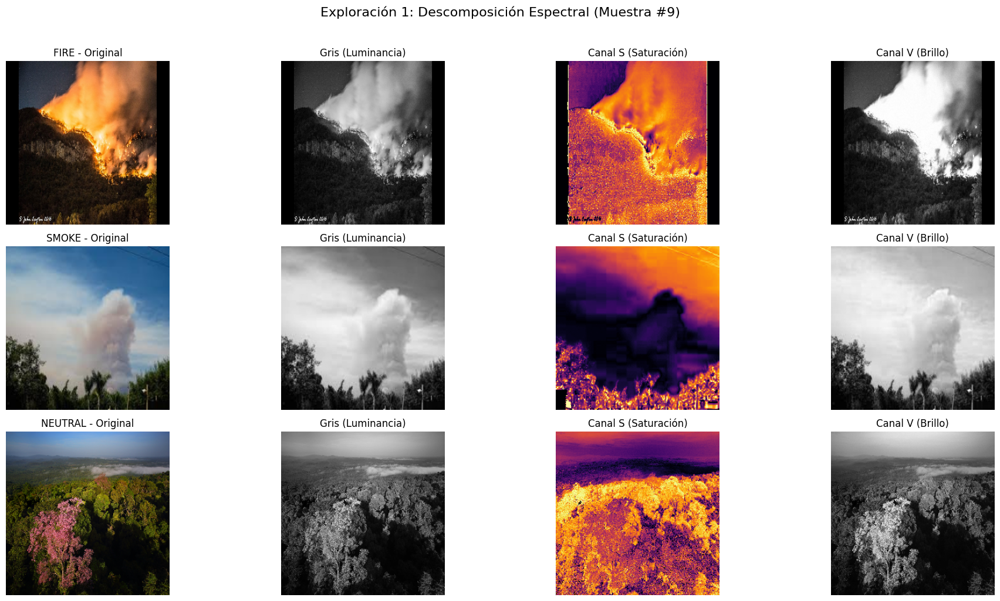

In [21]:
mostrar_canales(dataset, 9)

##### Muestra 14

Esto nos confirma que la Saturacion no es suficiente para hacer separaciones relevantes entre imagenes de un incendio forestal y un bosque, pues bosques con hojas rojas y anaranjadas harian que el modelo confundiera el fuego todo el año

Sin embargo el brillo muestra aqui el agente separador de llamas pues las hojas de estas tonalidades no se vuelven una mancha blanca como el fuego

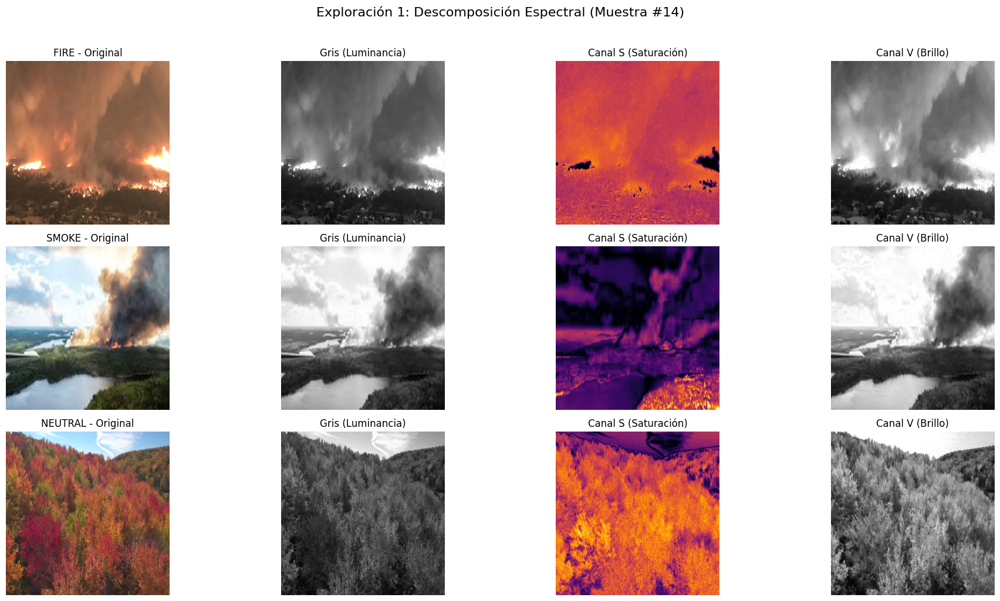

In [23]:
mostrar_canales(dataset, 14)

#### Metricas

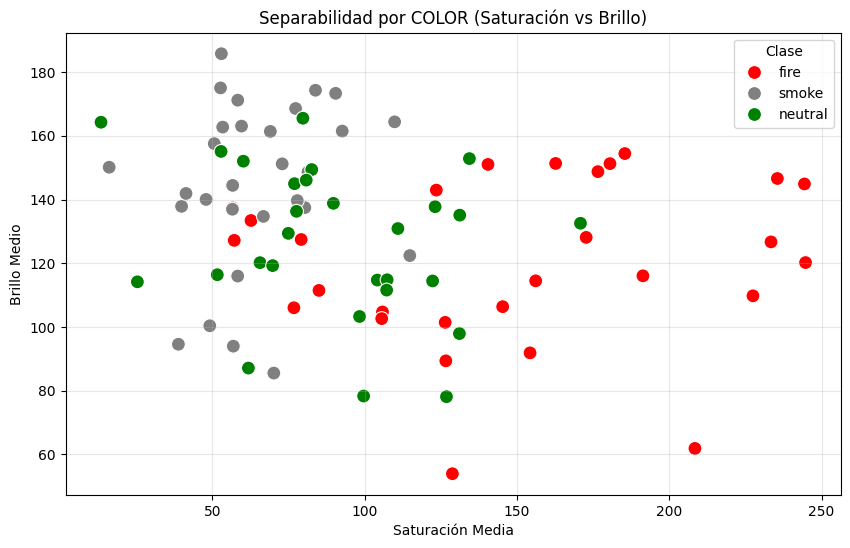

In [25]:
# Funcion para extraer los dos canales relevantes
def get_color_features(img_rgb):
    
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    
    # Feature 1: Saturacion
    mean = np.mean(s)
    
    # Feature 2: Value
    mean_v = np.mean(v)
    
    return [mean, mean_v]

X_color = []
y_labels = []

for label_name, images in dataset.items():
    label_idx = CLASSES.index(label_name) 
    for img in images:
        feats = get_color_features(img)
        X_color.append(feats)
        y_labels.append(label_idx)

X_color = np.array(X_color)
y_labels = np.array(y_labels)

df_color = pd.DataFrame(X_color, columns=['Saturacion', 'Brillo']) # Generamos un dataframe
df_color['Clase'] = [CLASSES[i] for i in y_labels] # y lo etiquetamos

def colorGraph():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_color, x='Saturacion', y='Brillo', hue='Clase', palette={'fire':'red', 'smoke':'gray', 'neutral':'green'}, s=100)
    plt.title("Separabilidad por COLOR (Saturación vs Brillo)")
    plt.xlabel("Saturación Media")
    plt.ylabel("Brillo Medio")
    plt.grid(True, alpha=0.3)
    plt.show()

colorGraph()

Podemos ver como claramente ya existe una separacion ligera entre la clase donde hay fuego y donde no

Con algunos outliers cuya saturacion media es baja, podemos asegurar que el fuego se posiciona mas en el centro en terminos de brillo
y con saturacion alta con respecto al bosque y al humo

Si separaramos ahora seguramente obtendriamos que el humo y el bosque se confunden mucho y con clusteres seguramente se mezclarian como una sola categoria

#### Entrenamiento Individual

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X_color, y_labels, test_size=0.3, random_state=42)

tree_color = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_color.fit(X_train, y_train)

y_pred = tree_color.predict(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"\nResultados del Modelo SOLO COLOR:")
print(f"Accuracy: {acc:.2f}")


Resultados del Modelo SOLO COLOR:
Accuracy: 0.58


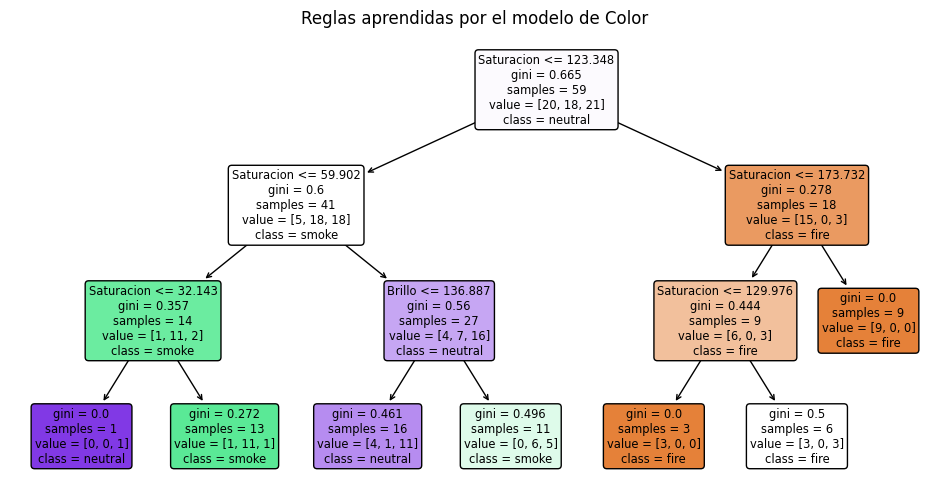

In [29]:
plt.figure(figsize=(12, 6))
plot_tree(tree_color, feature_names=['Saturacion', 'Brillo'], class_names=CLASSES, filled=True, rounded=True)
plt.title("Reglas aprendidas por el modelo de Color")
plt.show()

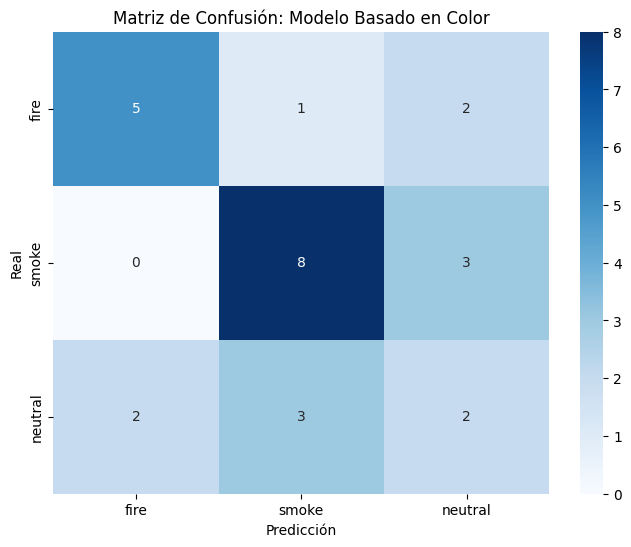

In [30]:
plt.figure(figsize=(8, 6))

cm = confusion_matrix(y_test, y_pred) 

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES)

plt.title('Matriz de Confusión: Modelo Basado en Color')
plt.ylabel('Real')
plt.xlabel('Predicción')
plt.show()

#### Conclusion

Para la primera exploracion de las imagenes podemos notar ya los primeros features que nos indican que es una flama o no, a pesar de las similitudes que tienen algunos canales la combinacion de Saturacion y Valor parece ser un primer buen indicio para empezar a separar nuestras categorias

## Bordes

Hipotesis:

Se postuló que la alta frecuencia espacial de las llamas generaría una densidad de bordes significativamente mayor que la de los fenómenos atmosféricos, ademas se intentara realizar en distintos canales del sistema de color HSV para aprovechar las ventajas del enfoque anterior y generar ya no solo extraer que tanto se tiene de un canal si no la morfologia que esos canales nos permiten ver

In [34]:
def bordes_canny(dataset, indice_muestra=0):
    """
    Objetivo: Probar la hipótesis de que Canny funciona mejor en canales
    donde el fondo se vuelve plano (Brillo o Saturación), evitando confundir
    ramas con fuego.
    """
    plt.figure(figsize=(18, 12))
    plt.suptitle(f"Exploración 2: Bordes en Canales V y S (Muestra #{indice_muestra})", fontsize=16, y=0.99)
    
    rows = len(CLASSES)
    cols = 4 
    CANNY_MIN = 80
    CANNY_MAX = 200
    
    for i, cls in enumerate(CLASSES):
        if len(dataset[cls]) > indice_muestra:
            img_rgb = dataset[cls][indice_muestra]
        else:
            continue
            
        # Convertir a HSV y separar
        hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)
        
        # Columna 1: Original
        plt.subplot(rows, cols, i*cols + 1)
        plt.imshow(img_rgb)
        plt.title(f"{cls.upper()} - Original")
        plt.axis('off')
        
        # Columna 2: Visualizar el Canal V (Brillo)
        plt.subplot(rows, cols, i*cols + 2)
        plt.imshow(v, cmap='gray')
        plt.title("Canal V (Brillo)")
        plt.axis('off')
        
        # Columna 3: Canny sobre BRİLLO (V)
        v_blurred = cv2.GaussianBlur(v, (5, 5), 0)
        edges_v = cv2.Canny(v_blurred, CANNY_MIN, CANNY_MAX)
        dens_v = np.count_nonzero(edges_v) / edges_v.size
        
        plt.subplot(rows, cols, i*cols + 3)
        plt.imshow(edges_v, cmap='gray')
        plt.title(f"Bordes en V\nDensidad: {dens_v:.4f}")
        plt.axis('off')
        
        # Columna 4: Canny sobre SATURACIÓN (S)
        s_blurred = cv2.GaussianBlur(s, (5, 5), 0)
        edges = cv2.Canny(s_blurred, CANNY_MIN, CANNY_MAX)
        dens = np.count_nonzero(edges) / edges.size
        
        plt.subplot(rows, cols, i*cols + 4)
        plt.imshow(edges, cmap='gray')
        plt.title(f"Bordes en S\nDensidad: {dens:.4f}")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

#### Muestreo y Analisis Aparente

##### Muestra 12: 
En esta muestra podemos ver como canny nos da un poco mas de informacion respecto a un atardecer lo que originalmente solo el color podria confundir
canny nos dio mas informacion, formar bordes en el fuego tambien provoco la conexion de los bordes de los arboles

sin embargo en la imagen con humo termina formando bordes muy definidos para unos arboles, lo que sugiere que este enfoque podria confundir al modelo

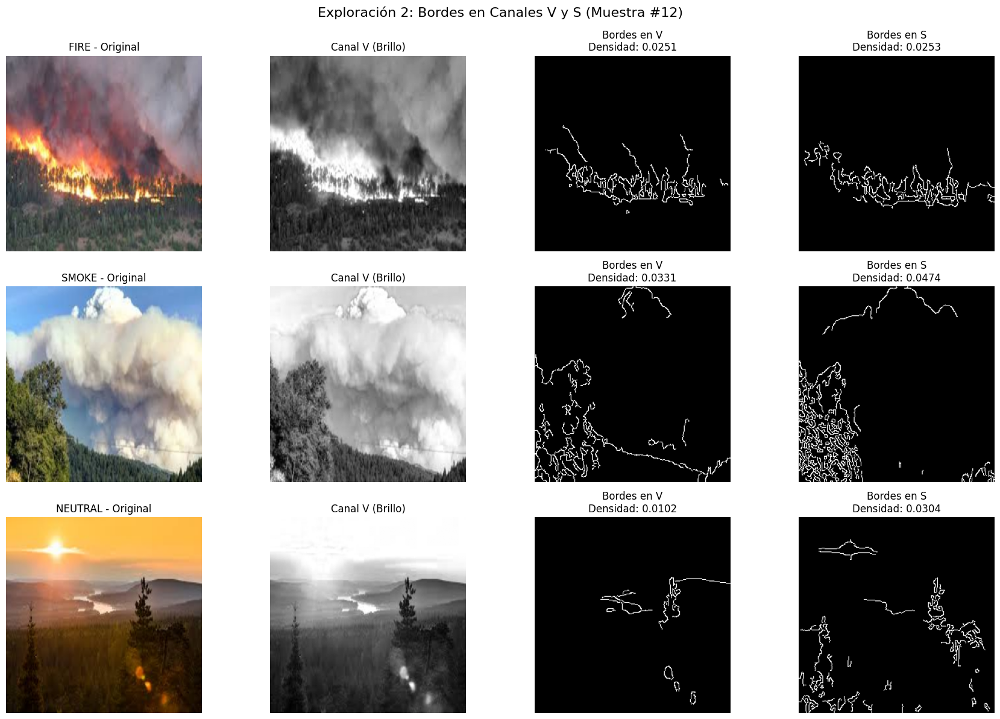

In [37]:
bordes_canny(dataset, indice_muestra=12)

##### Muestra 14

Lastimosamente canny aqui confundiria al modelo, la muestra anterior nos daba lo contrario a esta, los bordes para la imagen sin fuego aqui son mas abundantes que en la imagen con fuego

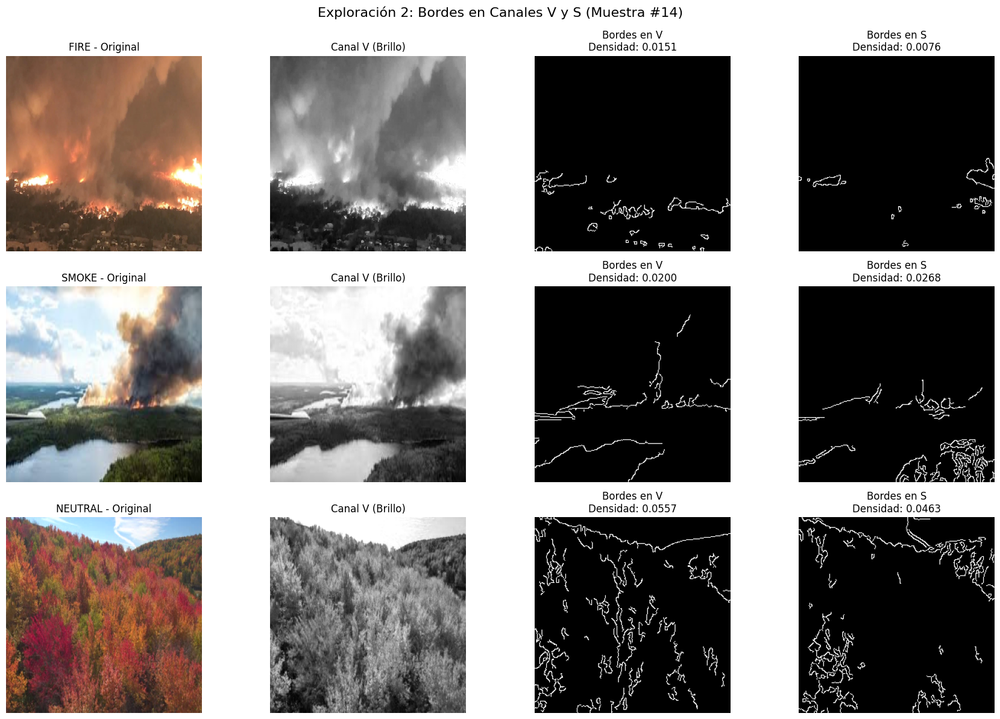

In [39]:
bordes_canny(dataset, indice_muestra=14)

##### Muestra 19

Lo que si es cierto es que canny hace un trabajo extraordinario para separar la niebla y el humo de las fotos con fuego
Aunque esto es importante esperemos que el pequeño desbalance de la muestra anterior no sea tan significativo

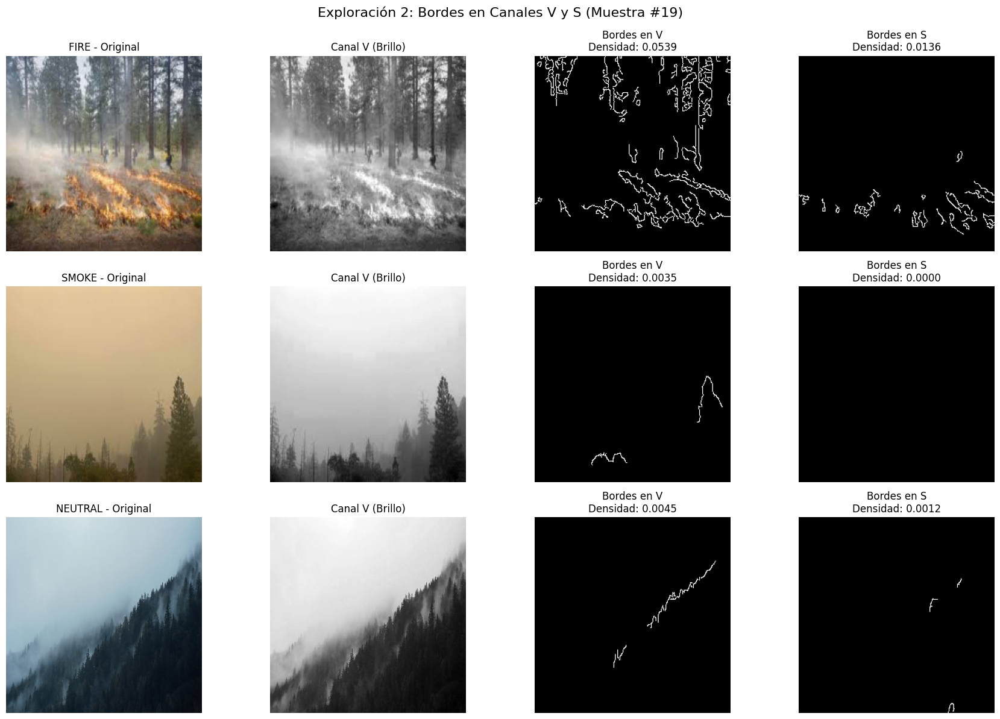

In [41]:
bordes_canny(dataset, indice_muestra=19)

#### Metricas

In [43]:
def get_edge_feature(img_rgb):
    
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

    h, s, v = cv2.split(hsv)
    
    blurred = cv2.GaussianBlur(v, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    density = np.count_nonzero(edges) / edges.size

    blurred_1 = cv2.GaussianBlur(s, (5, 5), 0)
    edges_1 = cv2.Canny(blurred_1, 50, 150)
    density_1 = np.count_nonzero(edges_1) / edges.size
    
    return [density,density_1]

X_edges = []

for label_name in CLASSES: 
    for img in dataset[label_name]:
        feat = get_edge_feature(img)
        X_edges.append(feat)

X_edges = np.array(X_edges)

In [44]:
def divideArr(arr):
    v = []
    s = []
    for i in arr:
        v.append(i[::2])
        s.append(i[1::2])
    return v,s

v,s = divideArr(X_edges)

,count,mean,std,min,max
Clase,,,,,
fire,28.0,0.073690,0.048130,0.011337,0.182739
neutral,28.0,0.074218,0.069875,0.003815,0.240372
smoke,29.0,0.035923,0.023598,0.005127,0.092575


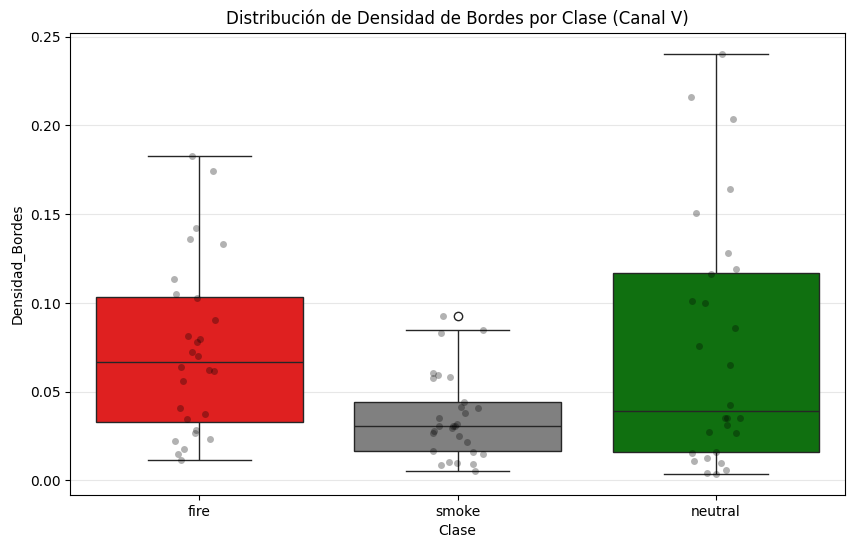

In [45]:
df_bordes = pd.DataFrame(v, columns=['Densidad_Bordes'])
df_bordes['Clase'] = [CLASSES[i] for i in y_labels]
df_metrics_canny = pd.DataFrame(v, columns=['Densidad_Bordes'])
df_metrics_canny['Clase'] = [CLASSES[i] for i in y_labels]

metrics_table = df_metrics_canny.groupby('Clase')['Densidad_Bordes'].describe()[['count', 'mean', 'std', 'min', 'max']]
display(metrics_table)

plt.figure(figsize=(10, 6))

# El Boxplot nos muestra dónde vive la mayoría de los datos de cada clase
# Algo como la media
sns.boxplot(x='Clase', y='Densidad_Bordes', data=df_metrics_canny, hue='Clase', palette={'fire':'red', 'smoke':'gray', 'neutral':'green'})
# Los datos reales para ver  como se dispersan
sns.stripplot(x='Clase', y='Densidad_Bordes', data=df_metrics_canny, color='black', alpha=0.3, jitter=True)

plt.title('Distribución de Densidad de Bordes por Clase (Canal V)')
plt.grid(True, axis='y', alpha=0.3)
plt.show()

Esto es significativo aqui podemos ver claramente como los valores de fire estan en por arriba de los de smoke y neutrales en general,
una buena señal para usar en la separacion final

#### Entrenamiento Individual

In [48]:
# Split y Entrenamiento
X_train_e_v, X_test_e_v, y_train_e_v, y_test_e_v = train_test_split(v, y_labels, test_size=0.3, random_state=42)

tree_e_vdges = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_e_vdges.fit(X_train_e_v, y_train_e_v)
y_pred_e_v = tree_e_vdges.predict(X_test_e_v)

print(f"Accuracy: {accuracy_score(y_test_e_v, y_pred_e_v):.2f}")

Accuracy: 0.50


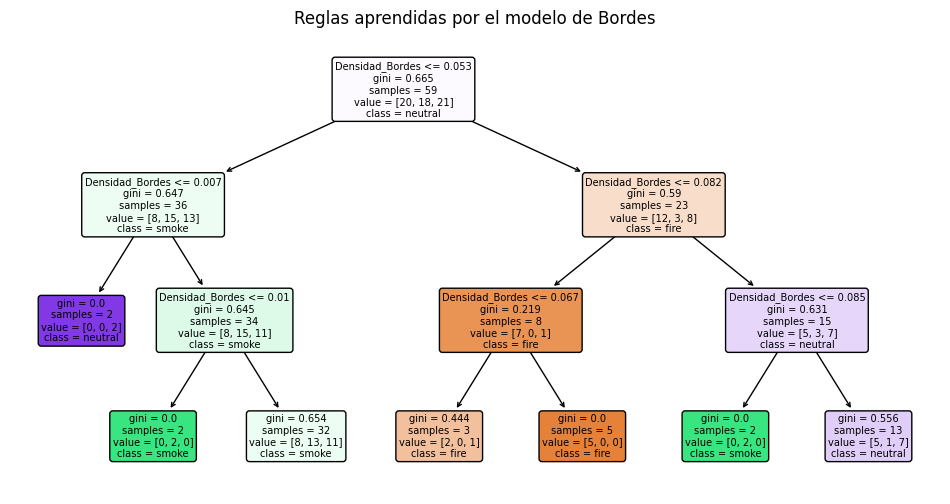

In [83]:
plt.figure(figsize=(12, 6))
plot_tree(tree_e_vdges, feature_names=['Densidad_Bordes'], class_names=CLASSES, filled=True, rounded=True)
plt.title("Reglas aprendidas por el modelo de Bordes")
plt.show()

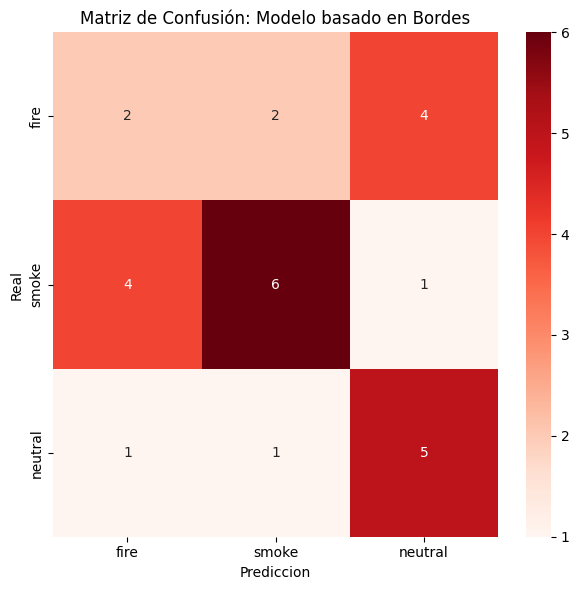

In [85]:
plt.subplot(1, 2, 2)
cm_e_v = confusion_matrix(y_test_e_v, y_pred_e_v) 
sns.heatmap(cm_e_v, annot=True, fmt='d', cmap='Reds',xticklabels=CLASSES, yticklabels=CLASSES)
plt.title('Matriz de Confusión: Modelo basado en Bordes')
plt.ylabel('Real')
plt.xlabel('Prediccion')

plt.tight_layout()
plt.show()

#### Pruebas con el canal de saturación

,count,mean,std,min,max
Clase,,,,,
fire,28.0,0.073690,0.048130,0.011337,0.182739
neutral,28.0,0.074218,0.069875,0.003815,0.240372
smoke,29.0,0.035923,0.023598,0.005127,0.092575


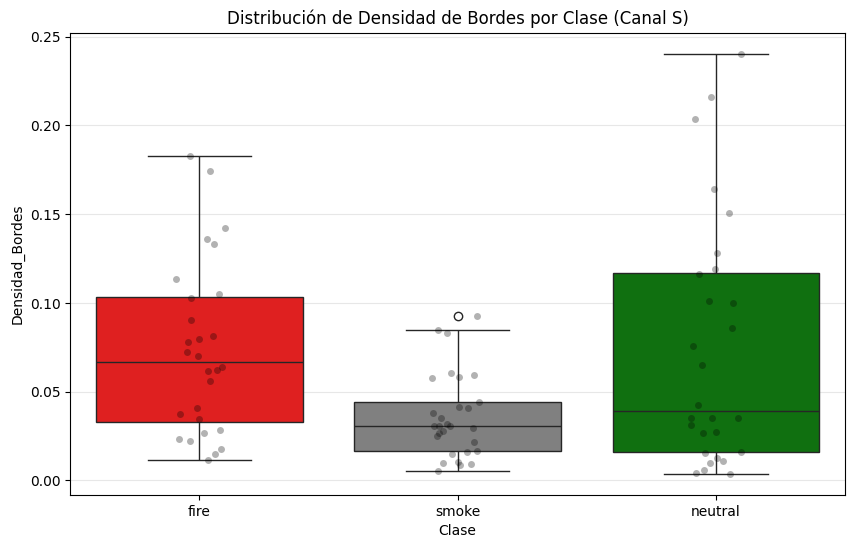

In [87]:
# Pegamos el mismo codigo pero sustituyendo v por el s que separamos hace rato

df_bordes = pd.DataFrame(s, columns=['Densidad_Bordes'])
df_bordes['Clase'] = [CLASSES[i] for i in y_labels]
df_metrics_canny = pd.DataFrame(v, columns=['Densidad_Bordes'])
df_metrics_canny['Clase'] = [CLASSES[i] for i in y_labels]

metrics_table = df_metrics_canny.groupby('Clase')['Densidad_Bordes'].describe()[['count', 'mean', 'std', 'min', 'max']]
display(metrics_table)

plt.figure(figsize=(10, 6))

# El Boxplot nos muestra dónde vive la mayoría de los datos de cada clase
# Algo como la media
sns.boxplot(x='Clase', y='Densidad_Bordes', data=df_metrics_canny, hue='Clase', palette={'fire':'red', 'smoke':'gray', 'neutral':'green'})
# Los datos reales para ver  como se dispersan
sns.stripplot(x='Clase', y='Densidad_Bordes', data=df_metrics_canny, color='black', alpha=0.3, jitter=True)

plt.title('Distribución de Densidad de Bordes por Clase (Canal S)')
plt.grid(True, axis='y', alpha=0.3)
plt.show()

#### Entrenamiento Individual

In [90]:
# Split y Entrenamiento
X_train_e_s, X_test_e_s, y_train_e_s, y_test_e_s = train_test_split(s, y_labels, test_size=0.3, random_state=42)

tree_e_sdges = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_e_sdges.fit(X_train_e_s, y_train_e_s)
y_pred_e_s = tree_e_sdges.predict(X_test_e_s)

print(f"Accuracy: {accuracy_score(y_test_e_s, y_pred_e_s):.2f}")

Accuracy: 0.58


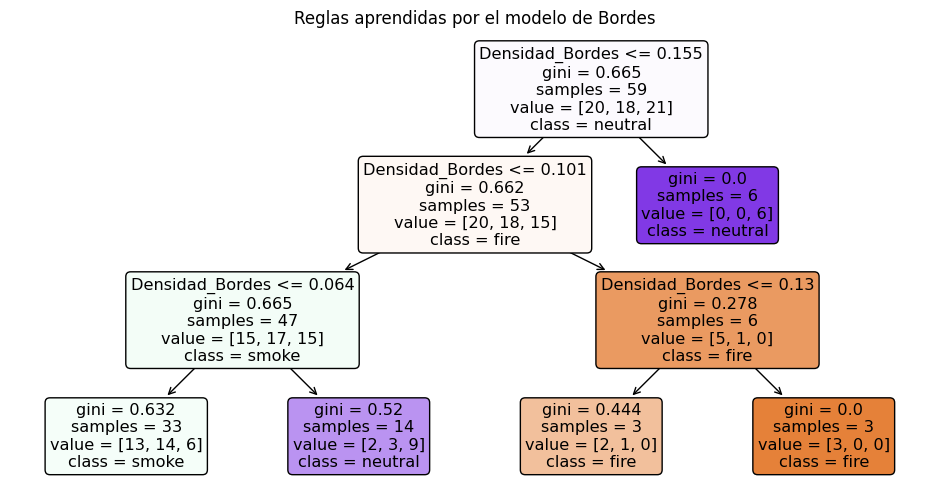

In [94]:
plt.figure(figsize=(12, 6))
plot_tree(tree_e_sdges, feature_names=['Densidad_Bordes'], class_names=CLASSES, filled=True, rounded=True)
plt.title("Reglas aprendidas por el modelo de Bordes")
plt.show()

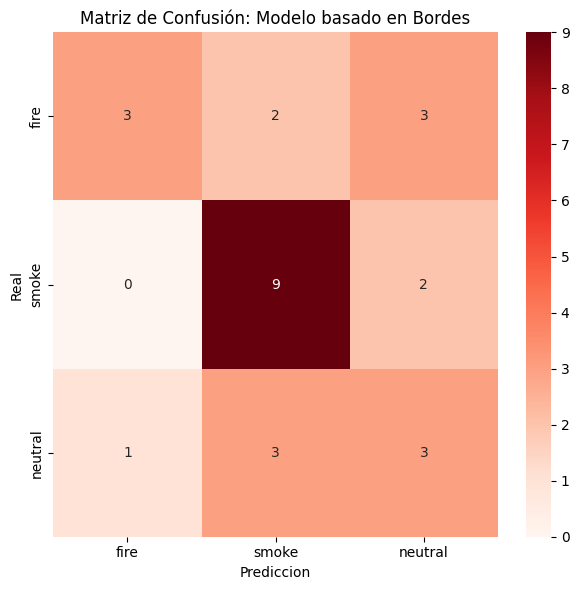

In [96]:
plt.subplot(1, 2, 2)
cm_e_s = confusion_matrix(y_test_e_s, y_pred_e_s) 
sns.heatmap(cm_e_s, annot=True, fmt='d', cmap='Reds',xticklabels=CLASSES, yticklabels=CLASSES)
plt.title('Matriz de Confusión: Modelo basado en Bordes')
plt.ylabel('Real')
plt.xlabel('Prediccion')

plt.tight_layout()
plt.show()

#### Conclusion

Canny en el caso de Value es literalmente un coinflip, aunque parece haber aumentado significativamente el entendimiento de que es el humo y que es un bosque confundio brutalmente el humo con fuego y el fuego con bosques normales, el rendimiento del fuego para la matriz de value

Sin embargo para el caso de saturacion aprendio con mucha precision lo que es el humo, por lo preciso que fue nos deharemos de Value por sus malos resultados y usaremos unicamente Saturation para el entrenamiento global

Mi prediccion es que su alta capacidad para separar la clase bosque de la clase humo hara que el modelo  mejore

## Primer entrenamiento global

In [99]:
X_global = np.hstack((X_color, s)) 

# Creamos df_global
df_global = pd.DataFrame(X_global, columns=['Saturacion', 'Brillo', 'Densidad_Bordes'])
df_global['Clase'] = [CLASSES[i] for i in y_labels]

display(df_global.head())

,Saturacion,Brillo,Densidad_Bordes,Clase
0,191.375198,116.054367,0.066223,fire
1,235.507858,146.603271,0.029480,fire
2,208.442291,61.878937,0.061325,fire
3,162.719437,151.330673,0.135193,fire
4,172.739243,128.118011,0.188553,fire


Accuracy: 0.65


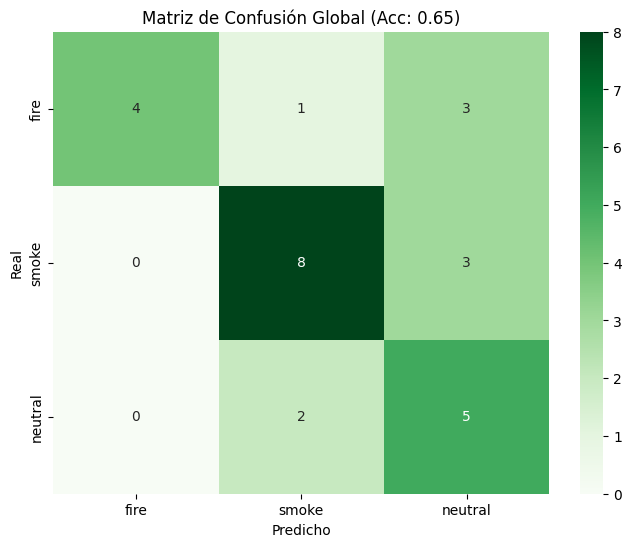

In [101]:
X_train_g, X_test_g, y_train_g, y_test_g = train_test_split(X_global, y_labels, test_size=0.3, random_state=42)

tree_global = DecisionTreeClassifier(max_depth=4, random_state=42)
tree_global.fit(X_train_g, y_train_g)
y_pred_g = tree_global.predict(X_test_g)

acc_g = accuracy_score(y_test_g, y_pred_g)
print(f"Accuracy: {acc_g:.2f}")

# Visualización Matriz Global
plt.figure(figsize=(8, 6))
cm_g = confusion_matrix(y_test_g, y_pred_g)
sns.heatmap(cm_g, annot=True, fmt='d', cmap='Greens', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title(f'Matriz de Confusión Global (Acc: {acc_g:.2f})')
plt.ylabel('Real')
plt.xlabel('Predicho')
plt.show()

El rendimiento incremento a un rango mas confiable, dejando ver una diagonal mas definida en la Matriz de Confusion por lo que solo falta separar que es un bosque de que es un incendio en los casos especiales

## yCbCr

Hipotesis:

Necesito explicar esto? 

Fuego = Rojizo

Bosque = Generalmente Verde

Si Rojizo Entonces Fuego

Bingo!!

Y... no del todo pero teorizo que con este feature el modelo sera capaz de separar con eficacia los casos de fuego equivocados que tuvo el modelo de HSV

Need i say more?

In [103]:
def ycbcr(dataset, indices_prueba={'fire': 0, 'smoke': 0, 'neutral': 0}):
    """
    Técnica: Espacio de Color YCbCr (Cr + Cb)
    Objetivo: Confirmar que el Fuego tiene Cr Alto (Rojo) y Cb Bajo (Azul),
    diferenciándose del Humo y Neutros.
    """
    plt.figure(figsize=(16, 12))
    plt.suptitle(f"Exploración: Separabilidad en Canales Cr (Rojo) y Cb (Azul)", fontsize=16, y=1.01)
    
    rows = len(CLASSES)
    cols = 4 # Original, Cr, Cb, Histograma Conjunto
    
    for i, cls in enumerate(CLASSES):
        idx = indices_prueba.get(cls, 0)
        
        if len(dataset[cls]) > idx:
            img_rgb = dataset[cls][idx]
        else:
            continue
            
        # 1. Original
        plt.subplot(rows, cols, i*cols + 1)
        plt.imshow(img_rgb)
        plt.title(f"{cls.upper()} (#{idx})")
        plt.axis('off')
        
        ycbcr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
        _, cr, cb = cv2.split(ycbcr)
        
        # 2. Canal Cr (Rojo)
        plt.subplot(rows, cols, i*cols + 2)
        plt.imshow(cr, cmap='inferno')
        plt.title(f"Canal Cr (Rojo)\nMedia: {np.mean(cr):.1f}")
        plt.axis('off')
        
        # 3. Canal Cb (Azul) - ¡NUEVO!
        plt.subplot(rows, cols, i*cols + 3)
        plt.imshow(cb, cmap='Blues') 
        # Usamos cmap Blues para que sea intuitivo (más oscuro = más azul/cb)
        plt.title(f"Canal Cb (Azul)\nMedia: {np.mean(cb):.1f}")
        plt.axis('off')
        
        # 4. Histograma Comparativo
        plt.subplot(rows, cols, i*cols + 4)
        plt.hist(cr.ravel(), 256, [0, 256], color='red', alpha=0.6, label='Cr')
        plt.hist(cb.ravel(), 256, [0, 256], color='blue', alpha=0.6, label='Cb')
        plt.title("Histogramas: Cr vs Cb")
        plt.xlim([0, 256])
        plt.legend()
        plt.grid(alpha=0.3, linestyle='--')
        
    plt.tight_layout()
    plt.show()

#### Muestreo y Analisis Aparente

##### Muestreo 1:

Ya para el caso base de esta exploracion podemos ver como el histograma del fuego tiene una cola en el lado mas alto de Cr
esto es una buena señal y en un momento mas veremos los detalles

Ademaas vemos un claro muro entre el canal azul y el rojo

Que esperemos que se separe mas con otras imagenes y que nos ayude mantener una raya mas firme entre hojas rojas y el fuego

C:\Users\darki\AppData\Local\Temp\ipykernel_16748\3488502005.py:45: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(cr.ravel(), 256, [0, 256], color='red', alpha=0.6, label='Cr')
C:\Users\darki\AppData\Local\Temp\ipykernel_16748\3488502005.py:46: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(cb.ravel(), 256, [0, 256], color='blue', alpha=0.6, label='Cb')


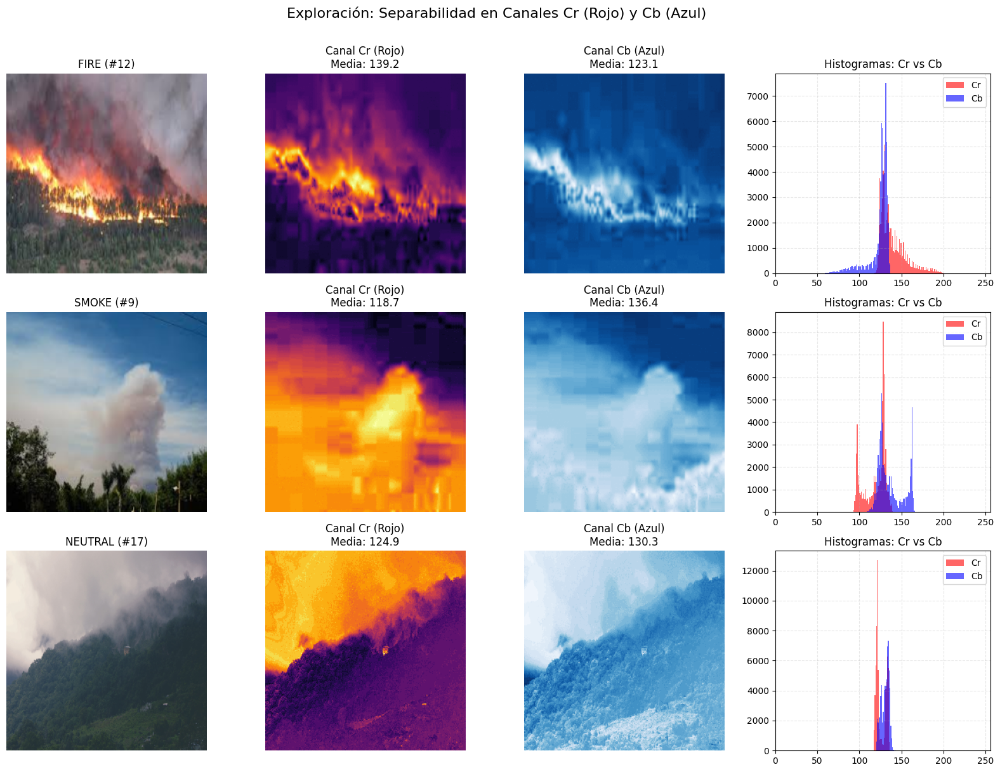

In [105]:
ycbcr(dataset, indices_prueba={'fire': 12, 'smoke': 9, 'neutral': 17})

##### Muestreo 2

La imagen 14 del dataset de neutrales sin duda sera el talon de aquiles de este modelo, pues la cola de estas hojas es incluso mas grande que la de algunos fuegos aun asi una intensa cantidad de fuego supera con creces un atardecer y unas hojas rojas

Tambien vemos que los histogramas que representan a Cr y Cb logran separarse por completo en la imagen del fuego
aqui con las dos imagenes mas peligrosas del dataset de neutrales y humo hay una clara separacion
esto es prometedor

C:\Users\darki\AppData\Local\Temp\ipykernel_16748\3488502005.py:45: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(cr.ravel(), 256, [0, 256], color='red', alpha=0.6, label='Cr')
C:\Users\darki\AppData\Local\Temp\ipykernel_16748\3488502005.py:46: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(cb.ravel(), 256, [0, 256], color='blue', alpha=0.6, label='Cb')


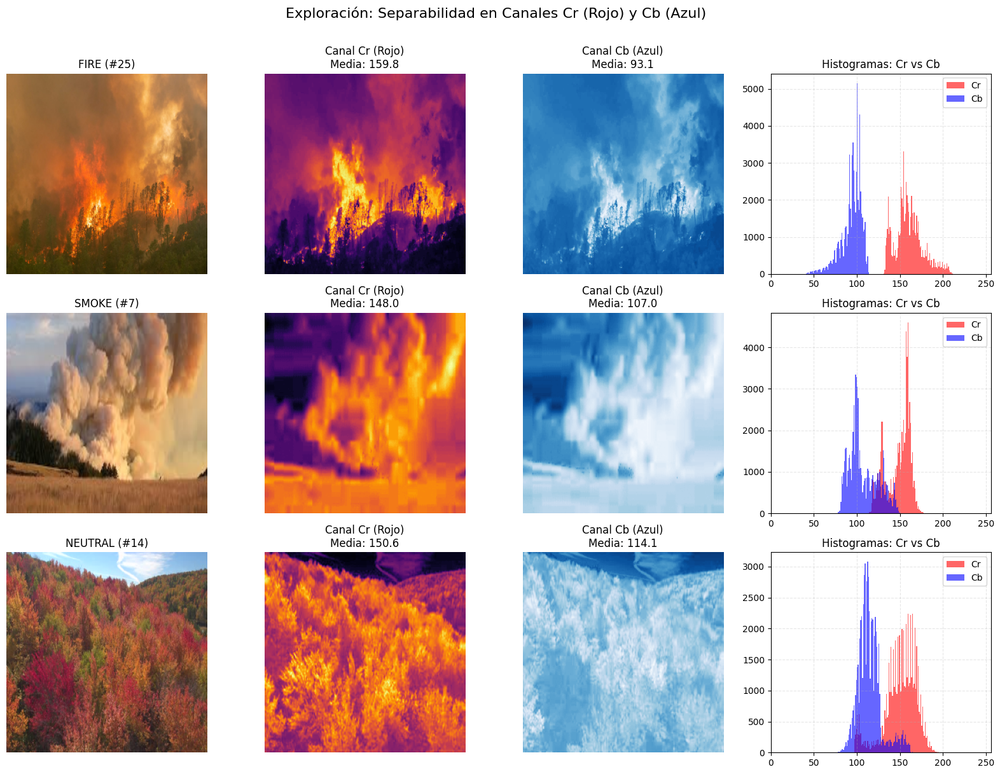

In [106]:
ycbcr(dataset, indices_prueba={'fire': 25, 'smoke': 7, 'neutral': 14})

#### Metricas

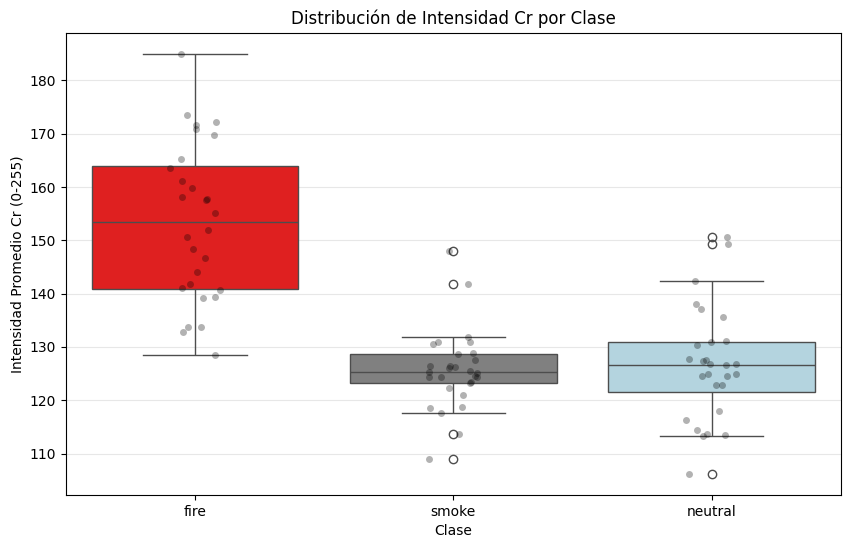


RESUMEN ESTADÍSTICO: CANAL Cr
           mean    std     min     max
Clase                                 
fire     153.32  14.78  128.57  184.98
neutral  126.72  10.59  106.21  150.57
smoke    125.70   7.42  108.90  147.96


In [107]:
def metricas_canal_cr(dataset):
    data_cr = []
    
    for cls in ['fire', 'smoke', 'neutral']:
        for img in dataset[cls]:
            
            ycbcr = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
            _, cr, _ = cv2.split(ycbcr)
            
            mean_cr = np.mean(cr)
            
            data_cr.append({'Clase': cls, 'Mean_Cr': mean_cr})
    df = pd.DataFrame(data_cr)
    
    return df

# Ejecutar
df_cr = metricas_canal_cr(dataset)

plt.figure(figsize=(10, 6))

# Boxplot
sns.boxplot(x='Clase', y='Mean_Cr', data=df_cr, hue='Clase',palette={'fire': 'red', 'smoke': 'gray', 'neutral': 'lightblue'})
sns.stripplot(x='Clase', y='Mean_Cr', data=df_cr, color='black', alpha=0.3, jitter=True)
plt.title('Distribución de Intensidad Cr por Clase')
plt.ylabel('Intensidad Promedio Cr (0-255)')
plt.grid(True, axis='y', alpha=0.3)

plt.show()

print("\nRESUMEN ESTADÍSTICO: CANAL Cr")
resumen = df_cr.groupby('Clase')['Mean_Cr'].agg(['mean', 'std', 'min', 'max']).round(2)
print(resumen.sort_values(by='mean', ascending=False))

Podemos ver claramente como la media de smoke y neutral es mucho mas baja que la de fire, pero algunos outliers podrian complicar
la adaptacion del modelo

Sin mencionar que el accuracy no lo es todo aqui, no nos sirve de mucho tener un modelo con 90% de accuracy que baja
a 10% si esta en un bosque con hojas rojas

#### Entrenamiento Individual

In [109]:
def get_ycbcr_features(img_rgb):
    ycbcr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    _, cr, cb = cv2.split(ycbcr)
    
    mean_cr = np.mean(cr)
    std_cr = np.std(cr)
    
    mean_cb = np.mean(cb)
    std_cb = np.std(cb)
    
    return [mean_cr, std_cr, mean_cb, std_cb]

X_ycbcr = []

for label_name in CLASSES:
    for img in dataset[label_name]:
        feat = get_ycbcr_features(img)
        X_ycbcr.append(feat)

X_ycbcr = np.array(X_ycbcr)

In [110]:
X_train_y, X_test_y, y_train_y, y_test_y = train_test_split(X_ycbcr, y_labels, test_size=0.3, random_state=42)

tree_ycbcr = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_ycbcr.fit(X_train_y, y_train_y)

y_pred_y = tree_ycbcr.predict(X_test_y)

print(f"Accuracy Modelo YCbCr (Cr + Cb): {accuracy_score(y_test_y, y_pred_y):.2f}")

Accuracy Modelo YCbCr (Cr + Cb): 0.54


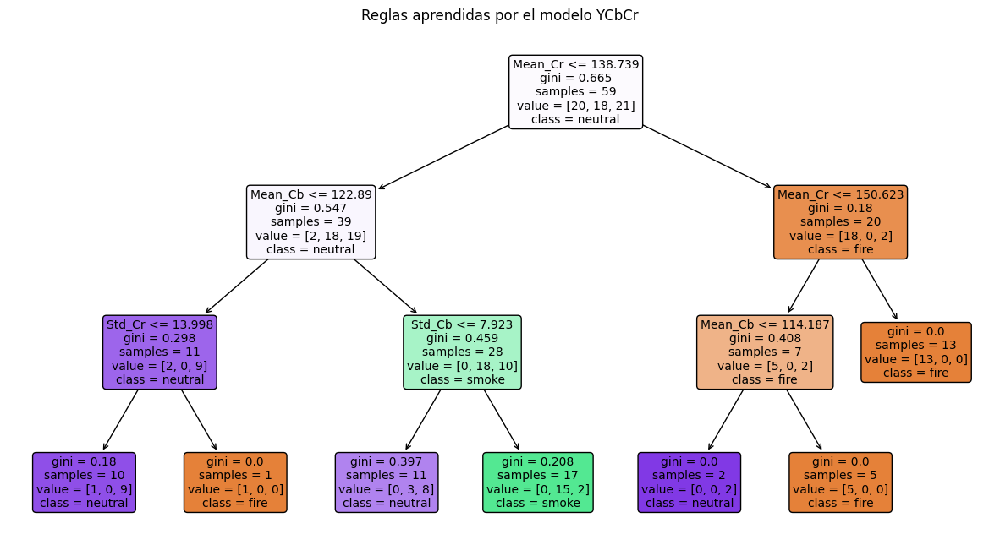

In [115]:
plt.figure(figsize=(15, 8))
plot_tree(tree_ycbcr, feature_names=['Mean_Cr', 'Std_Cr', 'Mean_Cb', 'Std_Cb'], class_names=CLASSES, filled=True, rounded=True, fontsize=10)
plt.title("Reglas aprendidas por el modelo YCbCr")
plt.show()

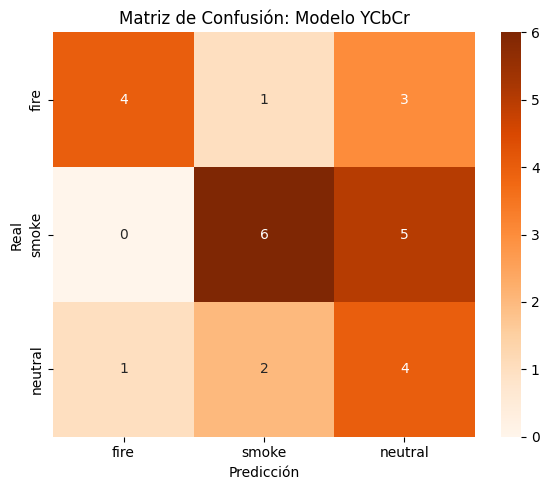

In [117]:
plt.figure(figsize=(6, 5))
cm_y = confusion_matrix(y_test_y, y_pred_y)
sns.heatmap(cm_y, annot=True, fmt='d', cmap='Oranges', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title('Matriz de Confusión: Modelo YCbCr')
plt.ylabel('Real')
plt.xlabel('Predicción')
plt.tight_layout()
plt.show()

## Sengudo Entrenamiento Global

In [121]:
X_global = np.hstack((X_color, s, X_ycbcr))

df_global = pd.DataFrame(X_global, columns=['Saturacion', 'Brillo', 'Densidad_Bordes', 'Mean_Cr', 'Std_Cr', 'Mean_Cb', 'Std_Cb'])
df_global['Clase'] = [CLASSES[i] for i in y_labels]

df_global = df_global[['Saturacion', 'Densidad_Bordes', 'Mean_Cr', 'Std_Cr']]

X_global = df_global.to_numpy()

display(df_global.head())

,Saturacion,Densidad_Bordes,Mean_Cr,Std_Cr
0,191.375198,0.066223,165.169983,27.334093
1,235.507858,0.029480,173.409393,23.058268
2,208.442291,0.061325,148.361816,14.346001
3,162.719437,0.135193,161.105377,13.358284
4,172.739243,0.188553,157.650284,19.906563


In [123]:
X_train_g, X_test_g, y_train_g, y_test_g = train_test_split(X_global, y_labels, test_size=0.3, random_state=42)

tree_global = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_global.fit(X_train_g, y_train_g)
y_pred_g = tree_global.predict(X_test_g)

acc_g = accuracy_score(y_test_g, y_pred_g)
print(f"Accuracy: {acc_g:.2f}")

print(classification_report(y_test_g, y_pred_g, target_names=CLASSES))

Accuracy: 0.62
              precision    recall  f1-score   support

        fire       0.67      0.75      0.71         8
       smoke       0.67      0.55      0.60        11
     neutral       0.50      0.57      0.53         7

    accuracy                           0.62        26
   macro avg       0.61      0.62      0.61        26
weighted avg       0.62      0.62      0.61        26



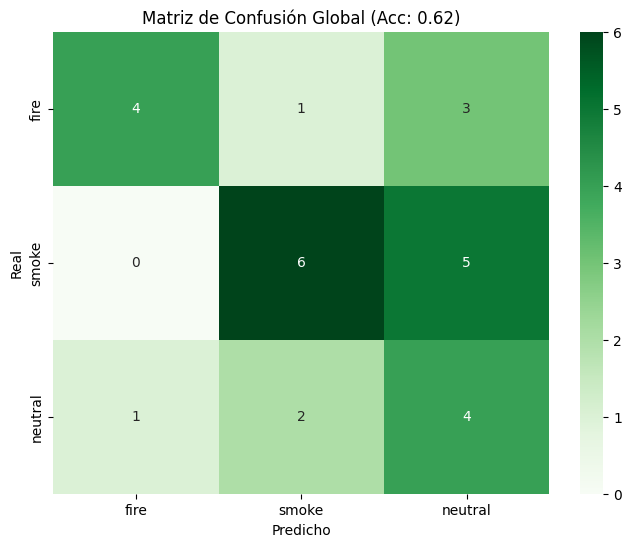

In [125]:
plt.figure(figsize=(8, 6))
cm_y = confusion_matrix(y_test_y, y_pred_y)
sns.heatmap(cm_y, annot=True, fmt='d', cmap='Greens', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title(f'Matriz de Confusión Global (Acc: {acc_g:.2f})')
plt.ylabel('Real')
plt.xlabel('Predicho')
plt.show()

El accuracy del global volvio a donde estaba respecto a cuando solo teniamos HSV hemos comprobado que canny hace las predicciones mas prometedoras asi que nuestro impostor debe estar en los modelos de color, dejaremos nuestra licuadora (Modelos global) intacta y pasemos a la siguiente exploración

# Caracteristicas Especificas para tratar incendios

Ya algo metido en el problema y con pocos dias para terminarlo (Esto es totalmente mi culpa)
me propuse investigar los metodos tradicionales de esta rama de la vision por computadora
esta parte de la libreta esta menos documentada pero se compensara en el reporte

Se seguira utilizando el mismo modelo global pero ya no habra una visualizacion detallada solo metricas
y entrenamiento

In [127]:
from skimage.feature import graycomatrix, graycoprops

# 1. Textura (GLCM)
def get_glcm_features(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    glcm = graycomatrix(gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    return [graycoprops(glcm, 'contrast')[0, 0], graycoprops(glcm, 'homogeneity')[0, 0]]

# 2. Forma (Momentos de Hu)
def get_hu_moments(img_rgb):
    ycbcr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(ycbcr)
    _, binary = cv2.threshold(cr, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    moments = cv2.moments(binary)
    hu = cv2.HuMoments(moments).flatten()
    return -1 * np.sign(hu) * np.log10(np.abs(hu) + 1e-10)

# 3. Frecuencia (FFT)
def get_fft_features(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude = 20 * np.log(np.abs(fshift) + 1e-10)
    return [np.mean(magnitude), np.std(magnitude)]

X_spatial = []
for label_name in CLASSES:
    for img in dataset[label_name]:
        feat = []
        feat.extend(get_glcm_features(img))
        feat.extend(get_hu_moments(img))
        feat.extend(get_fft_features(img))
        X_spatial.append(feat)

X_spatial = np.array(X_spatial)

In [129]:
# Fusión de tensores: [Color/Bordes] + [Estructura]
# Asumimos que X_color, X_edges (s) y X_ycbcr ya existen de celdas anteriores
X_spectral = np.hstack((X_color, s, X_ycbcr))
X_final = np.hstack((X_spectral, X_spatial))

feature_names = [
    'Saturacion', 'Brillo', 'Densidad_Bordes', 
    'Mean_Cr', 'Std_Cr', 'Mean_Cb', 'Std_Cb',
    'GLCM_Contrast', 'GLCM_Homogeneity',
    'Hu1', 'Hu2', 'Hu3', 'Hu4', 'Hu5', 'Hu6', 'Hu7',
    'Mean_FFT', 'Std_FFT'
]

X_train_f, X_test_f, y_train_f, y_test_f = train_test_split(X_final, y_labels, test_size=0.3, random_state=42)

# Aumentamos profundidad para permitir interacciones complejas
tree_final = DecisionTreeClassifier(max_depth=6, random_state=42)
tree_final.fit(X_train_f, y_train_f)
y_pred_f = tree_final.predict(X_test_f)

acc_final = accuracy_score(y_test_f, y_pred_f)
print(f"Accuracy Global Final: {acc_final:.2f}")
print(classification_report(y_test_f, y_pred_f, target_names=CLASSES))

Accuracy Global Final: 0.65
              precision    recall  f1-score   support

        fire       0.78      0.88      0.82         8
       smoke       0.67      0.55      0.60        11
     neutral       0.50      0.57      0.53         7

    accuracy                           0.65        26
   macro avg       0.65      0.66      0.65        26
weighted avg       0.66      0.65      0.65        26



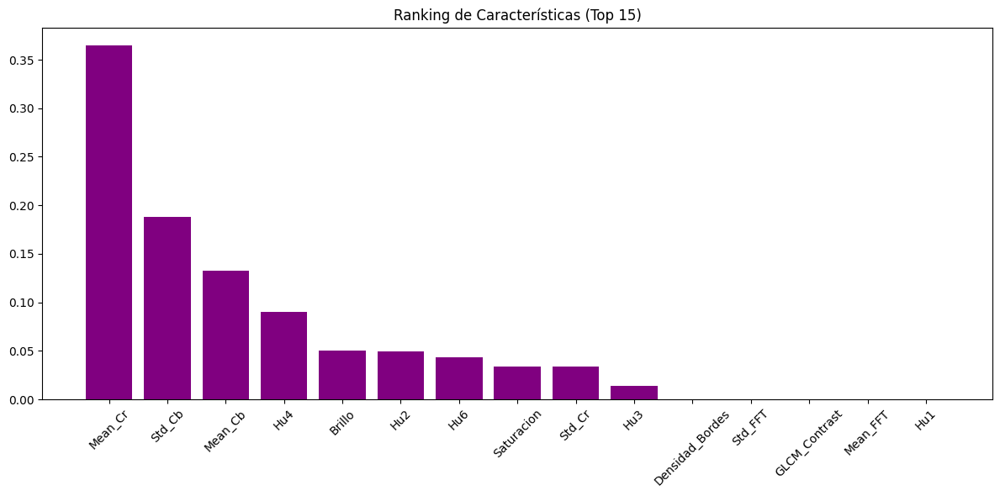

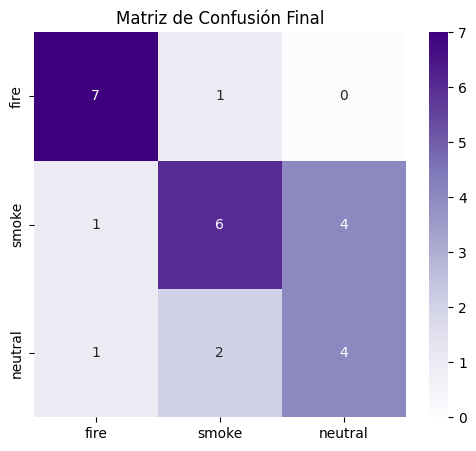

In [131]:
importances = tree_final.feature_importances_
indices = np.argsort(importances)[::-1]
top_n = 15

plt.figure(figsize=(12, 6))
plt.title("Ranking de Características (Top 15)")
plt.bar(range(top_n), importances[indices[:top_n]], align="center", color="purple")
plt.xticks(range(top_n), [feature_names[i] for i in indices[:top_n]], rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_test_f, y_pred_f), annot=True, fmt='d', cmap='Purples', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title('Matriz de Confusión Final')
plt.show()

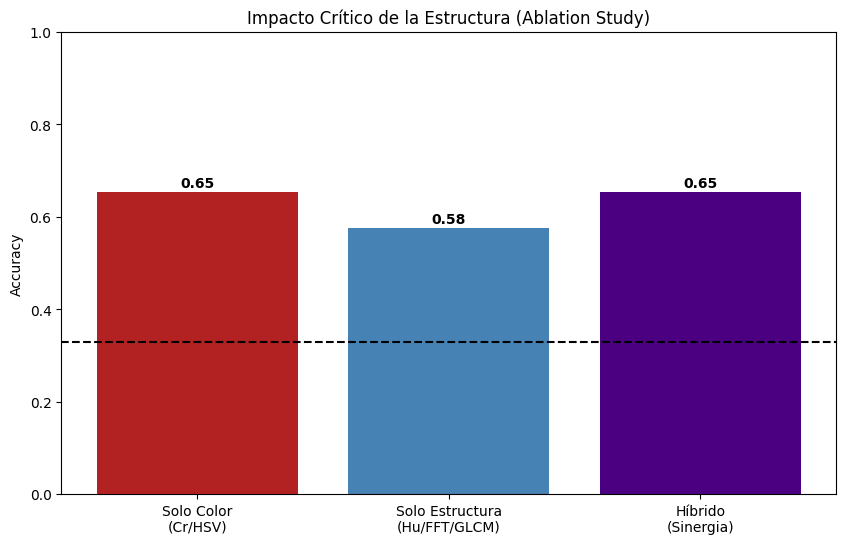

In [133]:
def evaluar_subset(X_subset, name):
    X_tr, X_te, y_tr, y_te = train_test_split(X_subset, y_labels, test_size=0.3, random_state=42)
    clf = DecisionTreeClassifier(max_depth=6, random_state=42)
    clf.fit(X_tr, y_tr)
    return accuracy_score(y_te, clf.predict(X_te))

# Escenarios
acc_solo_color = evaluar_subset(X_spectral, "Solo Color")
acc_solo_estructura = evaluar_subset(X_spatial, "Solo Estructura")
acc_completo = evaluar_subset(X_final, "Modelo Híbrido")

# Visualización
resultados = {
    'Solo Color\n(Cr/HSV)': acc_solo_color, 
    'Solo Estructura\n(Hu/FFT/GLCM)': acc_solo_estructura, 
    'Híbrido\n(Sinergia)': acc_completo
}

plt.figure(figsize=(10, 6))
bars = plt.bar(resultados.keys(), resultados.values(), color=['firebrick', 'steelblue', 'indigo'])
plt.title("Impacto Crítico de la Estructura (Ablation Study)")
plt.ylabel("Accuracy")
plt.ylim(0, 1.0)
plt.axhline(0.33, color='k', linestyle='--', label="Azar")

for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, f"{bar.get_height():.2f}", ha='center', fontweight='bold')

plt.show()

In [139]:
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X_glcm, y_labels, test_size=0.3, random_state=42)

tree_glcm = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_glcm.fit(X_train_t, y_train_t)

y_pred_t = tree_glcm.predict(X_test_t)

print(f"Accuracy Modelo Textura (GLCM): {accuracy_score(y_test_t, y_pred_t):.2f}")
print(classification_report(y_test_t, y_pred_t, target_names=CLASSES))

Accuracy Modelo Textura (GLCM): 0.54
              precision    recall  f1-score   support

        fire       0.50      0.38      0.43         8
       smoke       0.64      0.82      0.72        11
     neutral       0.33      0.29      0.31         7

    accuracy                           0.54        26
   macro avg       0.49      0.49      0.49        26
weighted avg       0.52      0.54      0.52        26



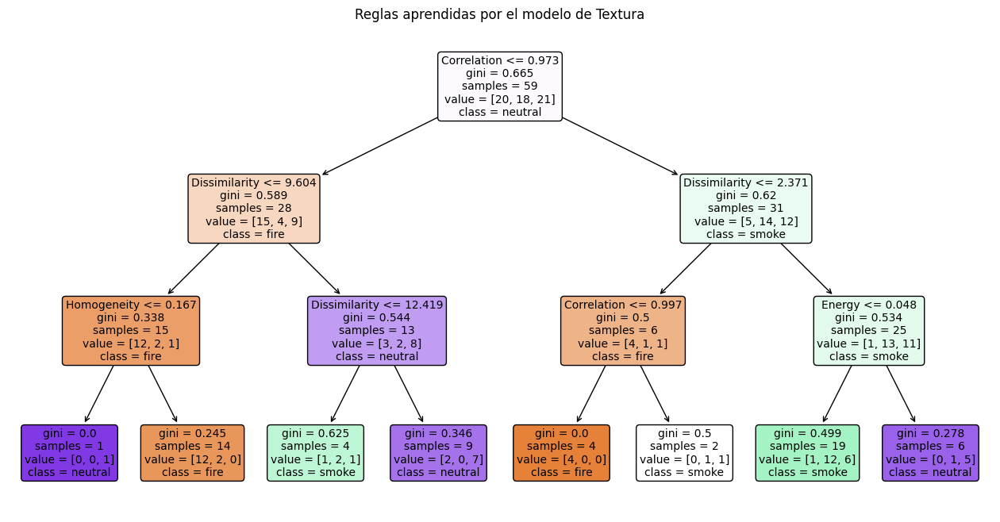

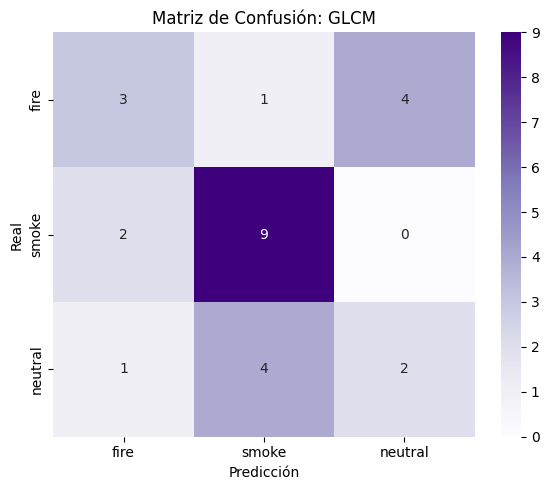

In [141]:
plt.figure(figsize=(16, 8))
plot_tree(tree_glcm, feature_names=['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation'], class_names=CLASSES, filled=True, rounded=True, fontsize=10)
plt.title("Reglas aprendidas por el modelo de Textura")
plt.show()

plt.figure(figsize=(6, 5))
cm_t = confusion_matrix(y_test_t, y_pred_t)
sns.heatmap(cm_t, annot=True, fmt='d', cmap='Purples', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title('Matriz de Confusión: GLCM')
plt.ylabel('Real')
plt.xlabel('Predicción')
plt.tight_layout()
plt.show()

In [143]:
X_global = np.hstack((X_color, s, X_ycbcr, X_glcm))

feature_names_global = [
    'Saturacion', 'Brillo', 
    'Densidad_Bordes', 
    'Mean_Cr', 'Std_Cr', 'Mean_Cb', 'Std_Cb',
    'Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation'
]

df_global = pd.DataFrame(X_global, columns=feature_names_global)
df_global['Clase'] = [CLASSES[i] for i in y_labels]

display(df_global.head())

,Saturacion,Brillo,Densidad_Bordes,Mean_Cr,Std_Cr,Mean_Cb,Std_Cb,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,Clase
0,191.375198,116.054367,0.066223,165.169983,27.334093,97.157471,24.801062,38.825888,2.508487,0.586384,0.082039,0.991800,fire
1,235.507858,146.603271,0.029480,173.409393,23.058268,88.872849,27.238803,29.100766,2.342096,0.550577,0.054306,0.996323,fire
2,208.442291,61.878937,0.061325,148.361816,14.346001,114.250977,12.615459,36.830178,1.774602,0.674149,0.097904,0.980524,fire
3,162.719437,151.330673,0.135193,161.105377,13.358284,98.164612,16.626591,211.045941,9.018336,0.229596,0.026661,0.947819,fire
4,172.739243,128.118011,0.188553,157.650284,19.906563,99.744507,24.152409,159.802022,7.737316,0.228474,0.020171,0.977124,fire


In [145]:
X_train_g, X_test_g, y_train_g, y_test_g = train_test_split(X_global, y_labels, test_size=0.3, random_state=42)

tree_global = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_global.fit(X_train_g, y_train_g)
y_pred_g = tree_global.predict(X_test_g)

acc_g = accuracy_score(y_test_g, y_pred_g)
print(f"Global Accuracy (con Textura): {acc_g:.2f}")

print(classification_report(y_test_g, y_pred_g, target_names=CLASSES))

Global Accuracy (con Textura): 0.62
              precision    recall  f1-score   support

        fire       0.67      0.75      0.71         8
       smoke       0.67      0.55      0.60        11
     neutral       0.50      0.57      0.53         7

    accuracy                           0.62        26
   macro avg       0.61      0.62      0.61        26
weighted avg       0.62      0.62      0.61        26



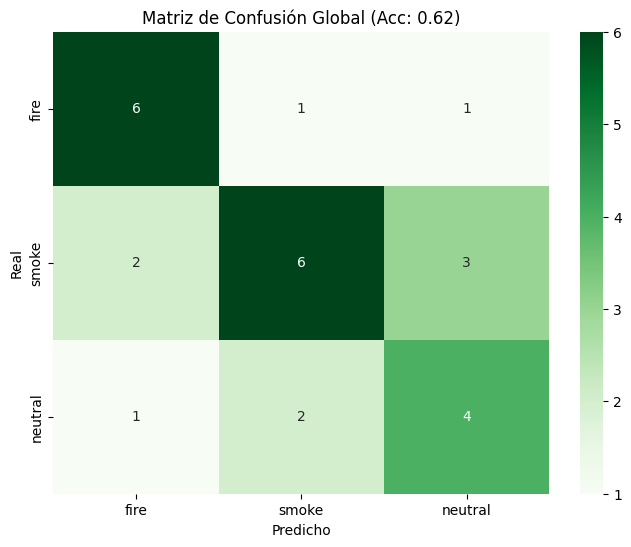

In [147]:
plt.figure(figsize=(8, 6))
cm_g = confusion_matrix(y_test_g, y_pred_g)
sns.heatmap(cm_g, annot=True, fmt='d', cmap='Greens', xticklabels=CLASSES, yticklabels=CLASSES)
plt.title(f'Matriz de Confusión Global (Acc: {acc_g:.2f})')
plt.ylabel('Real')
plt.xlabel('Predicho')
plt.show()

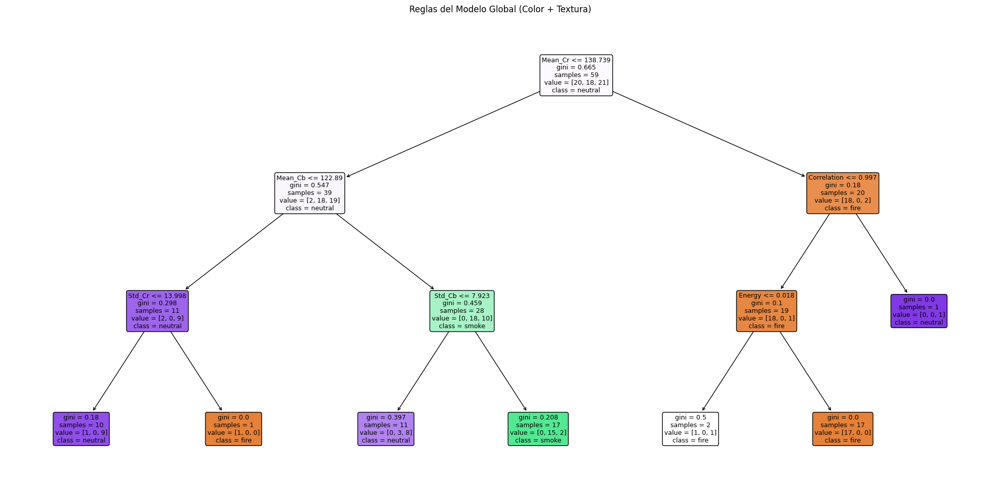

In [149]:
plt.figure(figsize=(25, 12))
plot_tree(tree_global, feature_names=feature_names_global, class_names=CLASSES, filled=True, rounded=True, fontsize=9)
plt.title("Reglas del Modelo Global (Color + Textura)")
plt.show()